# Tarea 3: Gráficas e Imágenes

Sobre esta tarea tengo que contarles una historia. 

Estoy comenzando una colaboración con experimentales. La idea es estudiar un sistema donde intruducir ruido pueda ayudar a ordenar un sistema. El experimento consiste en 2 partes. Primero poner unas esferitas de vídrio (de micras de radio) en agua y poner un patrón de difracción periódico con un láser (lineas paralelas periódicamente). Esto sirve como pinzas ópticas, de forma que las esferitas deben de atraerse hacia la luz y acomodarse a lo largo de las líneas.  Si el potencial (la intensidad del láser) no es suficientemente fuerte, entonces es superado por las fuerzas estocásticas (las moléculas de agua golpeando). En este caso, el sistema estará desordenado, pero poniendo ruido, podrían ordenarse las partículas, porque en algunas regiones los pozos de potencial serían suficientemente profundos. 

Yo llegué al grupo, porque en el análisis de la primera parte era necesario medir el orden cuando la potencia del láser es suficientemente grande y esa parte de medir el orden parecía difícil. Habían intentado varias cosas y parecía como que nunca se ordenaban las partículas a pesar de tener un láser muy potente (y sabían que para esas potencias deberían de tener ya una pinza óptica efectiva). La distancia entre las líneas del patrón de difracción es más o menos igual que el tamaño de las esferitas, así que a simple vista no se podía ver si se ordenaban. Como las lineas eran paralelas al eje $y$, la idea era proyectar todas las partículas sobre el eje $x$ y medir la densidad de partículas, o sea, hacer un histograma a lo largo del eje $x$, este debería verse como un seno. No se veía. Sacaron la transformada de Fourier y se veía un mini-pico, pero no era concluyente. Intentaron medir la difusión y tampoco; se veía igual en el eje $x$ que en el $y$. 

Después vino la pandemia, el experimento quedó en el abandono. Luego escucharon una plática que di sobre algo que tenía que ver con medir el orden de esferas duras y me contactaron. Decidimos comenzar una serie de reuniones para explicar el experimento, explicar cómo podría simular el fenómeno, etc. La semana pasada me tocaba revisar los videos del experimento y ver si podía repetir lo que ellos, pero con Julia. Lo dejé (como ustedes con las tareas) todo para el último día. 6h antes de la reunión me puse a trabajar en ello (muy mal de mi parte, por cierto). Separé el video en un vector de imágenes y revisé la primera imagen. Se veía ligeramente en el fondo el patrón de difracción (usan un filtro para que no se vea y se puedan reconocer mejor las partículas). Primera cosa que hice, fue ver cómo se veía la imagen en los diferentes colores del RBG. En azul, prácticamente no se veía, pero subiendo mucho la intensidad (multiplicando por 100 la cantidad de azul) ya se veía bien y se veía mucho el patrón de difracción. El detalle es que no estaba exactamente paralelo al eje $y$ y ese era todo el problema. Rotando la imagen un poquitito y luego proyectando, ya todo funcionaba. 

En esas 6h "problema resuelto". Por supuesto, para eso era necesario saber manejar bien las imágenes, para volver cada pixel una posición, reconocer qué son partículas y que no, etc. Pero en 6h fue más que suficiente para resolver el problema y hacer de paso un análisis sobre el ruido (algo que también veremos en alguna tarea o práctica) y una pequeña primera simulación sobre las partículas (Monte-Carlo, que también veremos al final del curso). Con esto no quiero presumir de lo que hice -realmente no creo que es extraordinario de mi parte- sino de lo que se puede lograr con el manejo de imágenes en Julia (esto sí me parece impresionante). El equipo experimental pasó mucho tiempo (no me dijeron cuanto, por pena, pero asumo que meses) buscando la solución, pero como a simple vista se veía el patrón de difracción paralelo al eje $y$, no pensaron en ese detalle. Debo decir, que todo se hace en la escala de micras, así que el patrón de difracción de hecho no se ve a simple vista, pero el microscopio tiene el filtro, así que tampoco se ve realmente en el microscopio, o se ve demasiado tenue. En fin, son de esas cosas "sencillas" que pueden ahorrarles mucho tiempo en el futuro. Analizar imágenes es realmente importante y muchas veces lo que se tiene que hacer es "sencillo". En esta tarea decidí enseñarles a usar una paquetería más que les puede ser útil. La dejaré sólo para uno de los problemas avanzados, para no afectarles en la calificación si tienen algún problema de instalación, pero inténten el problema aunque no sea el que elijan. 

Equipo:

- Alarcón Rodríguez Luis Guillermo
- Navarro Hernandez Itzam
- Salas Rodríguez Carlos Oswaldo

## Problemas Básicos

En esta tarea incluirás algunas de las cosas de la tarea pasada. Para esto haz un archivo que se llame "ObjetosYFunciones_NombreDeCadaUnoEnElEquipo.jl" (poniendo el nombre de cada uno del equipo) y que incluya los objetos y funciones de la tarea pasada que ocuparás. Por ejemplo, los objetos Segmento, Polígono, etc, las funciones para generarlos, etc... El archivo lo puedes hacer en un notebook y después descargarlo como .jl, pero también lo puedes hacer con cualquier editor de texto básico (como nel block de notas) y guardarlo como un archivo .jl. 

Para cargar el archivo .jl, necesitas poner la siguiente función

In [ ]:
include("ObjetosYFunciones_ItzamNavarroHernandez_LuisAlarconRodriguez_Ca-2.jl")

In [11]:
include("gato.jpeg")

LoadError: LoadError: syntax: invalid UTF-8 sequence
in expression starting at /Users/guillermoalarcon/Downloads/gato.jpeg:1

En caso de que tu archivo esté en otra carpeta necesitas poner toda la dirección, aunque lo recomendable es que esté en la misma carpeta. 

[1] **Diagramas de Cobweb:** Estos diagramas consisten de el mapeo $f$ (función) que se va a estudiar, la recta identidad, el segmento $(x_0,0), (x_0,f(x_0))$, y de los segmentos de la forma $(x_i, x_{i+1}), (x_{i+1},x_{i+1})$ y los segmentos de la forma $(x_{i+1},x_{i+1}), (x_{i+1},x_{i+2})$. Haz una función que dado un mapeo $f(x)$, un valor inicial $x_0$ y un número de aplicaciones del mapeo, regrese el diagrama de Cobweb correspondiente. Pruébalo con el mapeo logístico para el caso donde hay un punto atractivo (que corresponde a la intersección de la parábola y la recta identidad), comenzando desde $x_0 = 0.3$. Pruébalo también para el caso donde haya 2 valores que sean cíclicos (o sea que $f(f(x_c)) = x_c$, pero $f(x_c)  \ne x_c$ ). 

In [ ]:
using Plots
using LaTeXStrings

In [ ]:
function conweb(f,x0,n;limx=(0,0.11),limy=(0,0.31))
    puntox=[]
    puntoy=[]
    plot(f,xlim=limx,ylim=limy, label = "Función ingresada")
    plot!(x->x, label = "Identidad")
    insert!(puntox,1,x0)
    insert!(puntoy,1,0)
    insert!(puntox,2,x0)
    insert!(puntoy,2,f(x0))
    for i ∈ 1:n-2
        if mod(i,2) == 1
            insert!(puntox, i+2, puntoy[i+1])
            insert!(puntoy, i+2, puntoy[i+1])
        elseif mod(i,2) == 0
            insert!(puntox, i+2, puntox[i+1])
            insert!(puntoy, i+2, f(puntox[i+1][1]))
        end

    end
    plot!(puntox, puntoy, label = "Segmentos")

end


conweb(x->x^2,0.3,20,limx=(0,0.31),limy=(0,0.2))

In [ ]:
conweb(x->(x-0.2)^2,0.3,10,limx=(0,0.05),limy=(0,0.05))

In [ ]:
conweb(cos,0.3,200,limx=(0,1),limy=(0,1))

In [ ]:
conweb(x->(-x),1,10,limx=(-1.5,1.5),limy=(-1.5,1.5))

[2] **Ley de Zipf:** Para este ejercicio primero necesitas revisar cómo abrir un archivo txt y leerlo (para evitar copiar a mano un texto). Para esto usa el archivo "aleph.txt" que viene junto con esta tarea y prueba lo siguiente:

archivo = open("aleph.txt") 

texto = read(archivo, String) 

close(archivo)

La primera parte abre el archivo, la segunda linea lee el archvio y pone el texto en la variable texto y la última linea cierra el archivo (para que se pueda usar en algo más).

La tarea consiste en contar cuantas veces aparece cada palabra (usando las funciones que hiciste en la tarea pasada) y con ello hacer un histograma de ese conteo que esté ordenado por la frecuencia con la que aparecen las palabras, es decir, la primera palabra es la que más veces se repite y la última palabra es la que menos veces aparece en el texto. 

La gráfica hazla en escala logarítimca tanto en el eje x, como en el eje y (nota que si tienes 0's en tu conteo tendrás problemas para graficar, porque log(0) = -Inf). Pon además etiquetas a los ejes, el eje x "palabras", el eje y el LaTeX "P". 

Además agrega a este histograma una ley de potencia (una curva de la forma $y(x) = a x^\lambda$) que aproxime como decae el histograma (haz el ajuste a "ojo"). Agrega en este caso la etiqueta $y(x) = a x^\lambda$ a esta curva (sin que haya una etiqueta para el histograma). 

In [ ]:
archivo = open("aleph.txt")
texto = read(archivo, String)
close(archivo)

In [ ]:
function frecuencia(g)
    a=split(g, " ")
    l=[]
    h=[]
    u=unique(a)
    for n ∈ 1:length(u)
         d=0
        for i ∈ 1:length(a)
        if u[n]==a[i]
            d+=1
            end
        end
    push!(h, d)
    end
    append!(l, [u[i], h[i]] for i ∈ 1:length(u))
    y=sort!(l, by = x -> x[2], rev=true)
    return y
end

using Plots
using Statistics
using LaTeXStrings
using PlotlyJS

y=[frecuencia(texto)[i][2] for i ∈ 1:length(frecuencia(texto))]
valores=[(log(y[i])-log(267))/log(i) for i ∈ 2:length(y)]
λ=mean(valores)

plot(y,yaxis=:log,xaxis=:log,ylim=(1,260),xlim=(1,10^3),xlabel="Palabras",ylabel=L"P",label="")
plot!(x-> 267*(x^λ),label=L"y(x)=267^{%$λ}")

[3] Utilizando la técnica de graficar sobre imágenes (como con la curva de Koch en los videos), haz el fractal del triángulo de Sierpinski y un fractal de árbol o de helecho. Para ambos puedes usar una función iterativa. Sólo toma en cuenta que no debes de exagerar en el número de pasos, 7-10 pasos es suficiente para ver un fractal bonito. 

In [ ]:
using Images, ImageView, ImageIO, LinearAlgebra

imagen=[RGB(0,0,0) for i in 1:1500, j in 1:1500]

function dibuja_punto_en_imagen(x,y, cajax, cajay, w, h, Imagen)
    w, h = size(imagen)
    pixel_x = ceil(Int, w*(x-cajax[1])/(cajax[2]-cajax[1]))
    pixel_y = ceil(Int, h*(y-cajay[1])/(cajay[2]-cajay[1]))
    Imagen[pixel_y, pixel_x] = RGB(1,1,1)
end

function dividirtriangulo(vertices)
    x=vertices[1]+(vertices[2]-vertices[1])/2
    y=vertices[2]+(vertices[3]-vertices[2])/2
    z=vertices[1]+(vertices[3]-vertices[1])/2
    
    t1=[vertices[1],x,z]
    t2=[x,vertices[2],y]
    t3=[z,y,vertices[3]]
    
    return [t1,t2,t3]
end

function sierpinski(triangulos)
    temp=[]
    for i in 1:length(triangulos)
        temp=append!(temp,dividirtriangulo(triangulos[i]))
    end
    append!(triangulos,temp)
end

triangulos=[[[1,0],[0,0],[1/2,sqrt(3)/2]]]

for l in 1:10
    sierpinski(triangulos)
end

for j in 1:length(triangulos)
    for k in 1:3
        dibuja_punto_en_imagen(triangulos[j][k][1],triangulos[j][k][2],[-0.01,1.01],[-0.3,1.01],imagen)
    end
end

trian = [RGB(0,0,0) for i in 1:1500, j in 1:1500]
for i in 1:1500, j in 1:1500
    trian[i,j] = imagen[1501-i,1501-j]
end
trian

In [ ]:
imagen2=[RGB(0,0,0) for i in 1:1500, j in 1:1500]

function dibuja_punto_en_imagen(x,y, cajax, cajay, Imagen)
    w, h = size(imagen2)
    pixel_x = ceil(Int, w*(x-cajax[1])/(cajax[2]-cajax[1]))
    pixel_y = ceil(Int, h*(y-cajay[1])/(cajay[2]-cajay[1]))
    Imagen[pixel_y, pixel_x] = RGB(1,1,1)
end

function dibujarecta(a,b)
    for i in 0:0.01:1
        punto=a+(b-a)*i
        dibuja_punto_en_imagen(punto[1],punto[2],[-0.01,1.01],[-0.3,1.01],imagen2)
    end
end

function dividirrama(segmento,θ,r)
    rot1=[cos(θ) -sin(θ);
        sin(θ)  cos(θ)]
    rot2=[cos(-θ) -sin(-θ);
        sin(-θ)  cos(-θ)]
    x=(rot1*(segmento[2]-segmento[1]))*r
    y=(rot2*(segmento[2]-segmento[1]))*r
    rama1=[segmento[2],segmento[2]+x]
    rama2=[segmento[2],segmento[2]+y]
    
    return [rama1,rama2]
end

ramas=[[[1/2,0],[1/2,0.2]]]

function arbol(ramas,θ,r)
    temp=[]
    for i in 1:length(ramas)
        temp=append!(temp,dividirrama(ramas[i],θ,r))
    end
    append!(ramas,temp)
end

    for j in 1:10
        arbol(ramas,pi/5,0.7)
    end

    for n in 1:length(ramas)
        dibujarecta(ramas[n][1],ramas[n][2])
    end 

tree = [RGB(0,0,0) for i in 1:1500, j in 1:1500]
for i in 1:1500, j in 1:1500
    tree[i,j] = imagen2[1501-i,1501-j]
end
tree

[4] Importa Plots.plot y Plots.plot! para poder agregar un método para graficar tus objetos Segmento, LineaPoligonal y Poligono. En el caso de plot(O::Objeto), debo de borrar lo que se haya graficado antes y generar la nueva gráfica del objeto. En el caso de plot!(O::Objeto), debe de graficar el objeto sobre lo que se haya graficado anteriormente. 

En el video no lo aclaré, pero pueden usar "..." para los kargs. Por ejemplo:     

En este caso, yo podré hacer plot(O, color = :red) y automáticamente reconocerá el color :red como una opción, o puedo hacer plot(O, alpha = 0.5) y me lo pondrá con transparencia 0.5. 

In [ ]:
function LineaPoligonal(x)
    no_lados = length(x)
    
    segmentos = [segmento(x[i], x[i+1]) for i ∈ 1:no_lados-1]
    
    push!(segmentos, segmento(x[no_lados], x[1]))
    
    l = sum([s.longitud for s ∈ segmentos]) #l = longitud
    
    return LineaPoligonal(x, segmentos, l)
end

In [ ]:
function segmento(x1,x2)
    return Segmento(x1,x2,norm(x1-x2))
end

function poligono(x)
    no_lados = length(x)
    
    segmentos = [segmento(x[i], x[i+1]) for i ∈ 1:no_lados-1]
    
    push!(segmentos, segmento(x[no_lados], x[1]))
    
    p = sum([s.longitud for s ∈ segmentos]) #p = perimetro
    
    return Poligono(x, segmentos, p, area(x))
end

In [ ]:
Lp = LineaPoligonal([[0,0],[4,5],[11,23],[45,56]])

In [ ]:
s = segmento([0,1],[9,8])

In [ ]:
p=poligono([[-2,4],[1,3],[5,0],[0,-3]])

In [ ]:
import Plots.plot, Plots.plot!

function plot(f::Figura,c=:red,r=1)
    if f isa Poligono
        vx=[f.vertices[i][1] for i in 1:length(f.vertices)]
        vy=[f.vertices[i][2] for i in 1:length(f.vertices)]
        push!(vx,f.vertices[1][1])
        push!(vy,f.vertices[1][2])
        return plot(vx,vy,seriestype=[:shape,],color=c,ratio=r,label="")
    elseif f isa Segmento
        x=[f.inicio[1],f.final[1]]
        y=[f.inicio[2],f.final[2]]
        return plot(x,y,color=c,ratio=r,label="")
    elseif f isa LineaPoligonal
        vx=[f.vertices[i][1] for i in 1:length(f.vertices)]
        vy=[f.vertices[i][2] for i in 1:length(f.vertices)]
        return plot(vx,vy,color=c,ratio=r,label="")
    end
end

function plot!(f::Figura,c=:red,r=1)
    if f isa Poligono
        vx=[f.vertices[i][1] for i in 1:length(f.vertices)]
        vy=[f.vertices[i][2] for i in 1:length(f.vertices)]
        push!(vx,f.vertices[1][1])
        push!(vy,f.vertices[1][2])
        return plot!(vx,vy,seriestype=[:shape,],color=c,ratio=r,label="")
    elseif f isa Segmento
        x=[f.inicio[1],f.final[1]]
        y=[f.inicio[2],f.final[2]]
        return plot!(x,y,color=c,ratio=r,label="")
    elseif f isa LineaPoligonal
        vx=[f.vertices[i][1] for i in 1:length(f.vertices)]
        vy=[f.vertices[i][2] for i in 1:length(f.vertices)]
        return plot!(vx,vy,color=c,ratio=r,label="")
    end
end


plot(Lp)
plot!(p)
plot!(s)   

[5] Utiliza lo del ejercicio anterior y tu cálculo para encontrar la intersección entre el tiro parabólico y una línea poligonal (de la tarea anterior) para hacer una función que dada una posición inicial, una velocidad inicial y una línea poligonal, dibuje la línea poligonal y el tiro parabólico hasta el punto donde se da la intersección. 

[6] Un círculo es casi un polígono regular de $n$ lados si $n$ es grande. Visualmente, un polígono de 100 lados es más que suficiente para ver un círculo. Usando esto para hacer una función "plotcirculo!(x,r)" que grafique un círculo dada la posición $x$ y el radio $r$.  En tu función utiliza el argumento "..." para que puedas incluir color, grueso de línea, transparencia, rellenado, etc. Usa esta función para dibujar círculos en un arreglo triangular (en total 100 círculos), rellenos y con colores aleatorios (usando RGB). 

**Nota:** En Julia se tiene como convención que si el nombre de la función termina con !, entonces se debe actualizar alguna variable global. En este caso, el ! significa se actualiza la gráfica, es decir, que se debe de graficar sobre una gráfica ya existente y no borrar la gráfica. 

In [ ]:

using Plots
function graf_circulo(c,r,color=RGB(1,0,0))
    px=[]
    py=[]
    for θ in 0:2*pi/100:2*pi
        x=c[1]+r*cos(θ)
        y=c[2]+r*sin(θ)
        push!(px,x)
        push!(py,y)
    end
    push!(px,c[1]+r)
    push!(py,c[2])
    plot!(px,py,c=color,show=:ijulia, seriestype=[:shape,],label="")
end

# graf_circulo([2,3],3,RGB(1,0,0))

function redtriangular(h,c)
for l in 1:2
     for i in 1:c
        if i==1 && l==1
            plot(x->(tan(pi/3)*x-c*h/2),show=:ijulia,color=:black,alpha=0.2,ylim=(-5,5),xlim=(-5,5),label="")
            plot!(x->(tan(pi/3)*x*((-1)^l)-c*h/2),show=:ijulia,color=:black,alpha=0.2,label="")
        end
            plot!(x->(tan(pi/3)*x*((-1)^l)-c*h/2+i*h),show=:ijulia,color=:black,alpha=0.2,label="")
        if l==1
                plot!(x->i*h-c*h/2-1*h,show=:ijulia,color=:black,alpha=0.2,label="")
                plot!(x->i*h-c*h/2-1*h+h/2,show=:ijulia,color=:black,alpha=0.2,label="")
        end
    end
end
    
end

redtriangular(0.5,50)

for h in 1:20
    for k in 1:20
    if mod(h,2)==1
        graf_circulo([-20*(0.5/tan(pi/3))+k*(0.5/tan(pi/3)),-10*0.5+h*0.25-0.25],0.2*rand())
    end
    if mod(h,2)==0
        graf_circulo([-20*(0.5/tan(pi/3))+k*(0.5/tan(pi/3))+(0.5/tan(pi/3))/2,-10*0.5+h*0.25-0.25],0.2*rand())
    end
    end
end


[7] Repite el ejercicio anterior, pero esta vez con elipses (necesitarás ahora dar un eje mayor, eje menor, ángulo de inclinación y posición del centro). En el dibujo de las 100 elipses, pon los ángulos de giro aleatoriamente. 

In [ ]:
using LinearAlgebra

function graf_elipse(c,r1,r2,θ,color=RGB(1,0,0))
    px=[]
    py=[]
    xc=0
    yc=0
     for b in 0:2*pi/100:2*pi
        x=[(r2)*cos(b),(r1)*sin(b)]
        rot=[cos(θ) -sin(θ);
             sin(θ) cos(θ)]
        xr=rot*x
        if b == 0
            xc=xr[1]
            yc=xr[2]
        end
        push!(px,xr[1])
        push!(py,xr[2])
    end
    push!(px,xc)
    push!(py,yc)
    px=c[1] .+ px
    py=c[2] .+ py
    plot!(px,py,c=color,show=:ijulia, seriestype=[:shape,],label="")
end

# graf_elipse([1,1],1,2,pi/3)


redtriangular(0.5,50)

for h in 1:20
    for k in 1:20
    if mod(h,2)==1
        graf_elipse([-20*(0.5/tan(pi/3))+k*(0.5/tan(pi/3)),-10*0.5+h*0.25-0.25],0.10,0.15,rand([0,pi/3,2*pi/3]),RGB(k/20,0,h/20))
    end
    if mod(h,2)==0
        graf_elipse([-20*(0.5/tan(pi/3))+k*(0.5/tan(pi/3))+(0.5/tan(pi/3))/2,-10*0.5+h*0.25-0.25],0.10,0.15,rand([0,pi/3,2*pi/3]),RGB(k/20,0,h/20))
    end
    end
end
#Con estos datos se forman 400 elipses, es posible hacer mas circulos simplemente cambiando el limite de los for y
#el veinte de la funcion de los colores tiene que coincidir con el nuevo limite, pero al hacer esto
#se vuelve mas tardado de lo necesario, espero que con 400 baste la demostracion.

[8] Haz un objeto "Persona" que incluya brazo_izq, brazo_der, antebrazo_izq, antebrazo_der, torzo, cabeza, muslo_izq, muslo_der, pierna_izq, pierna_der, y color como características del objeto. Todas excepto cabeza y color son Segmentos. Cabeza es un número real que corresponde al radio y color es la unión de un RGB y un símbolo. Después haz una función que dada la altura, la posición, dimensión (2 o 3 dimensional) y el color produzca una Persona con una proporción adecuada, centro de torzo en la posición dada y uniendo adecuadamente los segmentos (con una postura "realista"). Finalmente agrega un método a plot y plot! para que dibuje una persona en el caso 2D y en el caso 3D. 

**Nota:** En el caso 3D, dibujar la cabeza es difícil. Pueden hacerlo usando surface, pero el método es diferente si usan pyplot que si usan plotly, que si usan gr. Por lo tanto, creo que es mejor dibujar muchos segmentos dibujando los meridianos de la esfera, lo cual hará que se vea como una figura de alambres, pero igual se ve bien. 

In [ ]:
function Circulo(r::Real, x::Array{Float64})
    return Circulo(r, x)
end

In [ ]:
function Segmento(x1,x2)
    return Segmento(x1,x2,norm(x1-x2))
end

In [ ]:
abstract type Figura_Geometrica end
mutable struct Segmento <: Figura_Geometrica
    inicio::Array{Float64}
    final::Array{Float64}
    longitud::Real
end

function Segmento(i::Array{Float64},f::Array{Float64})
    return Segmento(i,f,norm(f-i))
end

In [4]:
function Poligono(v::Array{Array{Float64,1},1})
    numlados = length(v)
    segmentos = [Segmento(v[i], v[i+1]).longitud for i ∈ 1:(numlados - 1)]
    push!(segmentos, Segmento(v[numlados], v[1]).longitud)
    perimetro = sum([lado for lado ∈ segmentos])
    return Poligono(v, segmentos, perimetro, area(v))
end

Poligono (generic function with 1 method)

In [5]:
using Plots

In [6]:
mutable struct Persona
    torzo::Segmento
    muslo_izq::Segmento
    muslo_der::Segmento
    pierna_izq::Segmento
    pierna_der::Segmento
    brazo_izq::Segmento
    brazo_der::Segmento
    antebrazo_izq::Segmento
    antebrazo_der::Segmento
    cabeza::Real
    x1::Real
    x2::Real
    color
end

function graf_circulo(c,r,color=RGB(1,0,0))
    px=[]
    py=[]
    for θ in 0:2*pi/100:2*pi
        x=c[1]+r*cos(θ)
        y=c[2]+r*sin(θ)
        push!(px,x)
        push!(py,y)
    end
    push!(px,c[1]+r)
    push!(py,c[2])
    plot!(px,py,c=color,show=:ijulia, seriestype=[:shape,],label="")
end

function creaPersona(h::Real, x::Vector{Float64}, d::Int8,c)
    if d == 2
        torzo = Segmento([x[1], x[2] - 4/20 * h], [x[1], x[2] + 6/20 * h])
        muslo_izq = Segmento([x[1], x[2] - 4/20 * h], [x[1] - 3/20 * h, x[2] - 6/20 * h])
        muslo_der = Segmento([x[1], x[2] - 4/20 * h], [x[1] + 3/20 * h, x[2] - 6/20 * h])
        pierna_izq = Segmento([x[1] - 3/20 * h, x[2] - 6/20 * h], [x[1] - 4/20 * h, x[2] - 10/20 * h])
        pierna_der = Segmento([x[1] + 3/20 * h, x[2] - 6/20 * h], [x[1] + 4/20 * h, x[2] - 10/20 * h])
        brazo_izq = Segmento([x[1], x[2] + 6.5/20 * h], [x[1] - 3/20 * h, x[2] + 1/20 * h])
        brazo_der = Segmento([x[1], x[2] + 6.5/20 * h], [x[1] + 3/20 * h, x[2] + 1/20 * h])
        antebrazo_izq = Segmento([x[1] - 3/20 * h, x[2] + 1/20 * h], [x[1] - 4/20 * h, x[2] - 6/20 * h])
        antebrazo_der = Segmento([x[1] + 3/20 * h, x[2] + 1/20 * h], [x[1] + 4/20 * h, x[2] - 6/20 * h])
        cabeza = 2/20*h
        x1=x[1]
        x2=x[2]+8/20*h
        color=c

        return Persona(torzo,muslo_izq,muslo_der,pierna_izq,pierna_der,brazo_izq,brazo_der,antebrazo_izq,antebrazo_der,cabeza,x1,x2,color)
    end
    if d == 3
        torzo = Segmento([x[1], x[2] - 4/20 * h,x[3]], [x[1], x[2] + 6/20 * h,x[3]])
        muslo_izq = Segmento([x[1], x[2] - 4/20 * h,x[3]], [x[1] - 3/20 * h, x[2] - 6/20 * h,x[3]])
        muslo_der = Segmento([x[1], x[2] - 4/20 * h,x[3]], [x[1] + 3/20 * h, x[2] - 6/20 * h,x[3]])
        pierna_izq = Segmento([x[1] - 3/20 * h, x[2] - 6/20 * h,x[3]], [x[1] - 4/20 * h, x[2] - 10/20 * h,x[3]])
        pierna_der = Segmento([x[1] + 3/20 * h, x[2] - 6/20 * h,x[3]], [x[1] + 4/20 * h, x[2] - 10/20 * h,x[3]])
        brazo_izq = Segmento([x[1], x[2] + 6.5/20 * h,x[3]], [x[1] - 3/20 * h, x[2] + 1/20 * h,x[3]])
        brazo_der = Segmento([x[1], x[2] + 6.5/20 * h,x[3]], [x[1] + 3/20 * h, x[2] + 1/20 * h],x[3])
        antebrazo_izq = Segmento([x[1] - 3/20 * h, x[2] + 1/20 * h,x[3]], [x[1] - 4/20 * h, x[2] - 6/20 * h,x[3]])
        antebrazo_der = Segmento([x[1] + 3/20 * h, x[2] + 1/20 * h,x[3]], [x[1] + 4/20 * h, x[2] - 6/20 * h,x[3]])
        cabeza = 2/20*h
        x1=x[1]
        x2=x[2]+8/20*h
        color=c

        return Persona(torzo,muslo_izq,muslo_der,pierna_izq,pierna_der,brazo_izq,brazo_der,antebrazo_izq,antebrazo_der,cabeza,x1,x2,color)
    
    
    end
end
plot((creaPersona(1,[0.,0.,1.],Int8(3),:red)))
plot!((creaPersona(0.5,[2.,0.,0.],Int8(3),:red)))



LoadError: TypeError: in Persona, in type definition, expected Type, got a value of type typeof(Segmento)

In [ ]:
import Plots.plot, Plots.plot!
function plot(p::Persona)
    plot(p.torzo)
    plot!(p.muslo_izq)
    plot!(p.muslo_der)
    plot!(p.antebrazo_izq)
    plot!(p.antebrazo_der)
    plot!(p.pierna_izq)
    plot!(p.pierna_der)
    plot!(p.brazo_izq)
    plot!(p.brazo_der)
    graf_circulo([p.x1,p.x2],p.cabeza,p.color)
end
function plot!(p::Persona)
    plot!(p.torzo)
    plot!(p.muslo_izq)
    plot!(p.muslo_der)
    plot!(p.antebrazo_izq)
    plot!(p.antebrazo_der)
    plot!(p.pierna_izq)
    plot!(p.pierna_der)
    plot!(p.brazo_izq)
    plot!(p.brazo_der)
    graf_circulo([p.x1,p.x2],p.cabeza,p.color)
end

In [ ]:
plot!(1.0,[2.0, 3.0],2,RGB(1,0.2,0.1))

[9] **Convoluciones:** Una de las ventajas de trabajar con imágenes en Julia (o cualquier lenguaje de programación), es que uno puede hacer funciones que apliquen automáticamente algún efecto que se quiera. Algunas de las transformaciones más útiles son algo que se conoce como convoluciones. Para hacer una convolución primero necesitamos generar una función para mezclar colores de un cuadrado de $(2n+1)\times (2n+1)$ pixeles (típicamente elegimos $n = 1$), que se le conoce como Kernel. Por ejemplo, digamos que queremos hacer un kernel que promedie colores. Para cada pixel (que es un objeto RGB), obtenemos la cantidad de rojo, verde y azul que tiene usando pixel[i,j].r, pixel[i,j].g y pixel[i,j].b, luego, en la nueva imágen tendremos que pixel_nueva_imagen[i,j] = RGB((pixel[i,j].r+pixel[i,j+1].r+pixel[i,j-1].r+...)/9, (pixel[i,j].g+pixel[i,j+1].g+pixel[i,j-1].g+...)/9, (pixel[i,j].b+pixel[i,j+1].b+pixel[i,j-1].b+...)/9). 

Aquí hay que notar que cuando i o j corresponden a la frontera, no existirán algunos de los vecinos. En ese caso se puede sustituir el vecino por un color fijo, por ejemplo negro o blanco. 

Haz una función para obtener la convolución usando la regla del promedio. Pruébalo con varias fotografías, ¿qué notas? es decir ¿qué es lo que parece que hace esta convolución?  

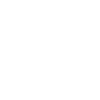

In [14]:
using Images, ImageView, ImageIO
function prom(x)  #Imagen
    
    y = []
    for i in 1:(size(x)[1])
        for j in 1:(size(x)[2])
            try
                push!(y, [(Float64(x[i,j].r) + Float64(x[i,j+1].r) + Float64(x[i,j-1].r) + Float64(x[i-1,j].r) + Float64(x[i+1,j].r) + Float64(x[i-1,j-1].r) + Float64(x[i-1,j+1].r) + Float64(x[i+1,j-1].r) + Float64(x[i+1,j+1].r)) / 9.0, (Float64(x[i,j].g) + Float64(x[i,j+1].g) + Float64(x[i,j-1].g) + Float64(x[i-1,j].g) + Float64(x[i+1,j].g) + Float64(x[i-1,j-1].g) + Float64(x[i-1,j+1].g) + Float64(x[i+1,j-1].g) + Float64(x[i+1,j+1].g)) / 9.0, (Float64(x[i,j].b) + Float64(x[i,j+1].b) + Float64(x[i,j-1].b) + Float64(x[i-1,j].b) + Float64(x[i+1,j].b) + Float64(x[i-1,j-1].b) + Float64(x[i-1,j+1].b) + Float64(x[i+1,j-1].b) + Float64(x[i+1,j+1].b)) / 9.0])
            catch
            end 
        end
    end
    y
    
    z = []
    for i in 0:((size(x)[1]-2)-1)
        push!(z, y[(((size(x)[2]-2)*i)+1):((size(x)[2]-2)*(i+1))])
    end
    z
    
    m(a,b) = z[a][b]
    v = [m(a,b) for a in 1:(size(x)[1]-2), b in 1:(size(x)[2]-2)]
    
    rgb(c) = RGB(c[1],c[2],c[3])
    
    rgb.(v)
    
end

A = [RGB(1,1,1) for x in 1:20, y in 1:20]

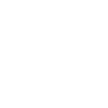

In [15]:
prom(A)

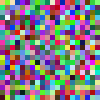

In [16]:
B = [rand(RGB) for x in 1:20, y in 1:20]

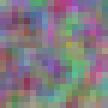

In [17]:
prom(B)

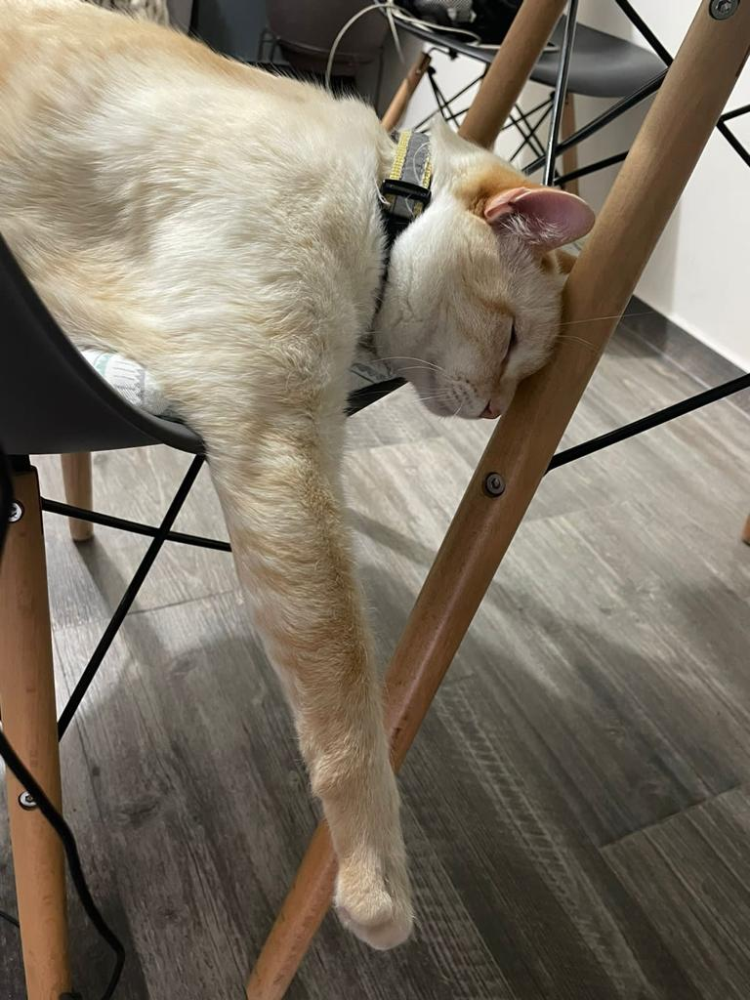

In [18]:
foto = load("gato.jpeg")

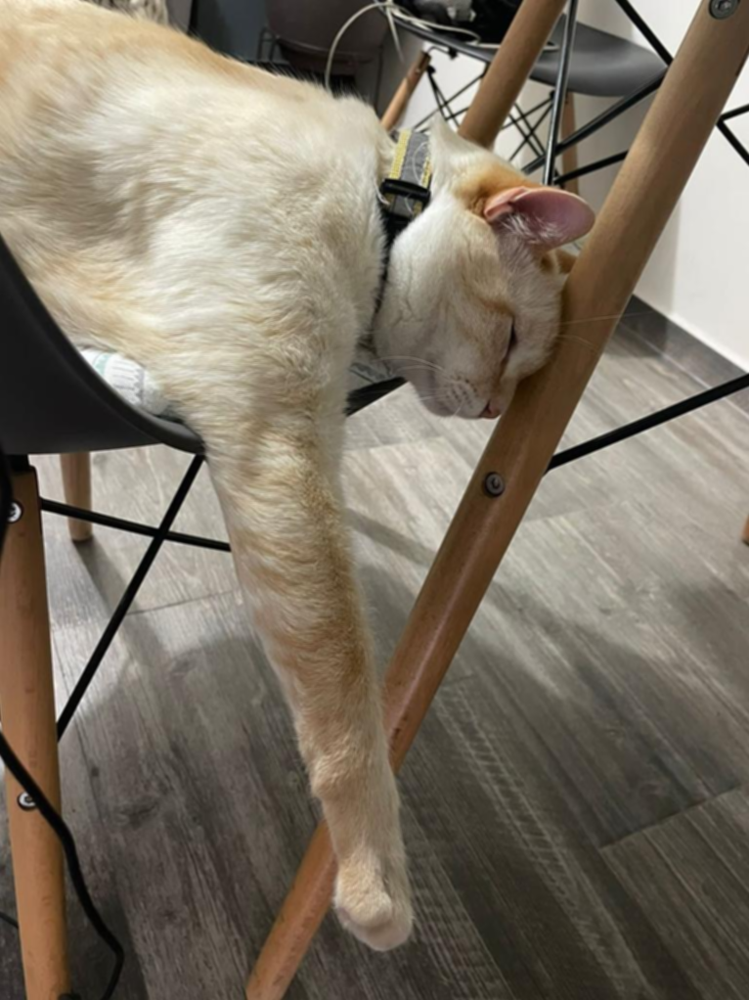

In [19]:
prom(foto)

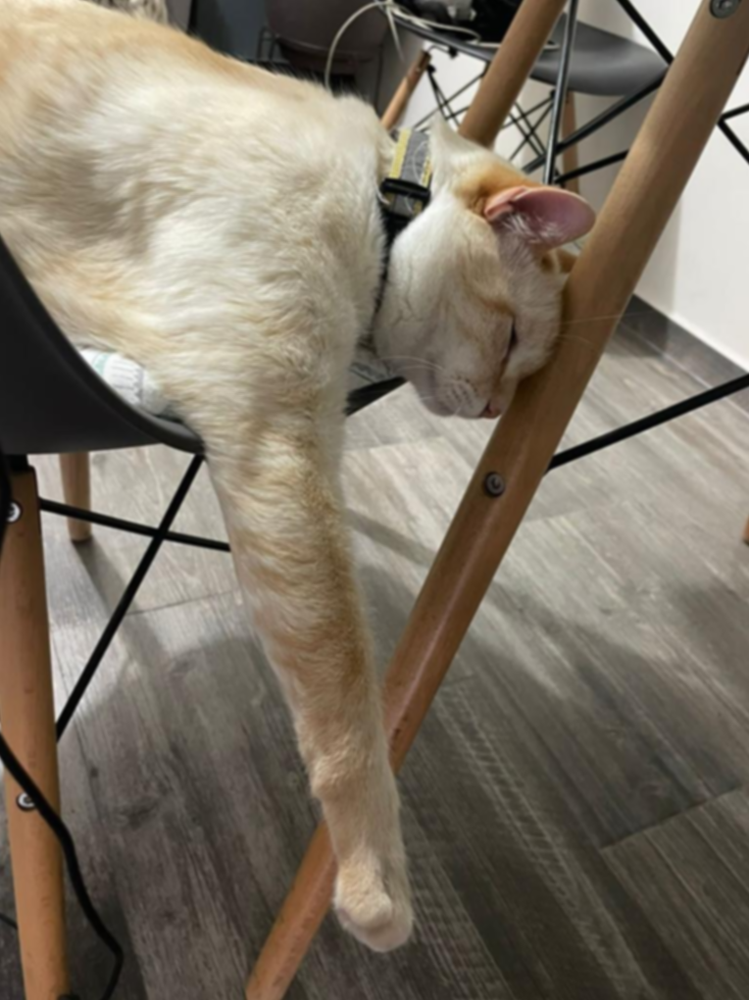

In [20]:
prom(prom(foto))

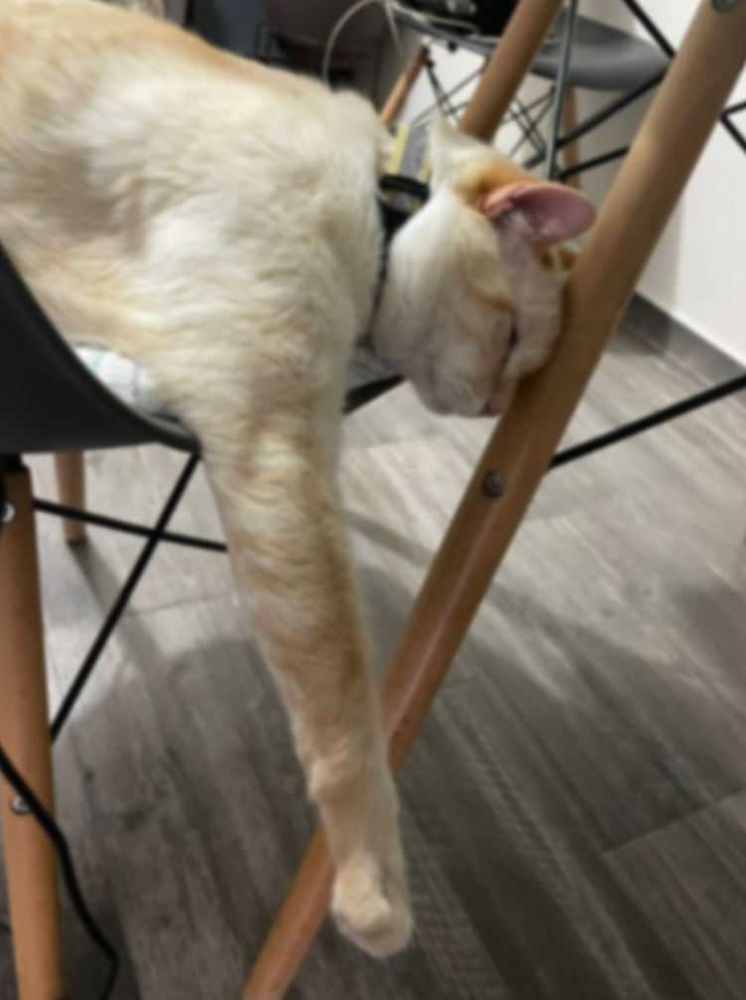

In [21]:
prom(prom(prom(prom(prom(prom(prom(prom(foto)))))))) 

[10] **Convoluciones-continuación:** Ahora haz una función que dado un Kernel (una matriz de $(2n+1)\times (2n+1)$ que dice cual es el peso de cada pixel vecino y el mismo pixel involucrado a la hora de sumar (o restar) colores), que obtenga la imágen convolucionada. 

prueba usando estos algunos de estos kernels: https://en.wikipedia.org/wiki/Kernel_(image_processing) sobre las imágenes de tu preferencia. 

**Nota:** En la lista de kernels de wikipedia vienen algunos donde pueden salir proporciones negativas de algún color. No tiene sentido $RGB(-1,0,0)$, así que la regla es: si algún color tiene más de 1, entonces se vuelve 1 y si tiene menos de 0, se vuelve 0. 

In [22]:
function convolucion(x, y) # matriz de 3x3, imagen
    
    z = []                                  ## Aquí se multiplica el kernel en cada pixel de la imagen y nos regresa
    for i in 1:size(y)[1]                    # un arreglo con los pixeles de la nueva foto, usando operaciones con elementos RGB
        for j in 1:size(y)[2]
            try
                push!(z, sum(x .* [y[i-1,j-1] y[i-1,j] y[i-1,j+1]; y[i,j-1] y[i,j] y[i,j+1]; y[i+1,j-1] y[i+1,j] y[i+1,j+1]]))
            catch
            end
        end
    end
    z

    w = []                                                             ## Usamos el mismo método que en ej. anterior
    for i in 0:((size(y)[1]-2)-1)
        push!(w, z[(((size(y)[2]-2)*i)+1):((size(y)[2]-2)*(i+1))])
    end
    w
    
    m(a,b) = w[a][b]
    v = [m(a,b) for a in 1:(size(y)[1]-2), b in 1:(size(y)[2]-2)]

end
    

convolucion (generic function with 1 method)

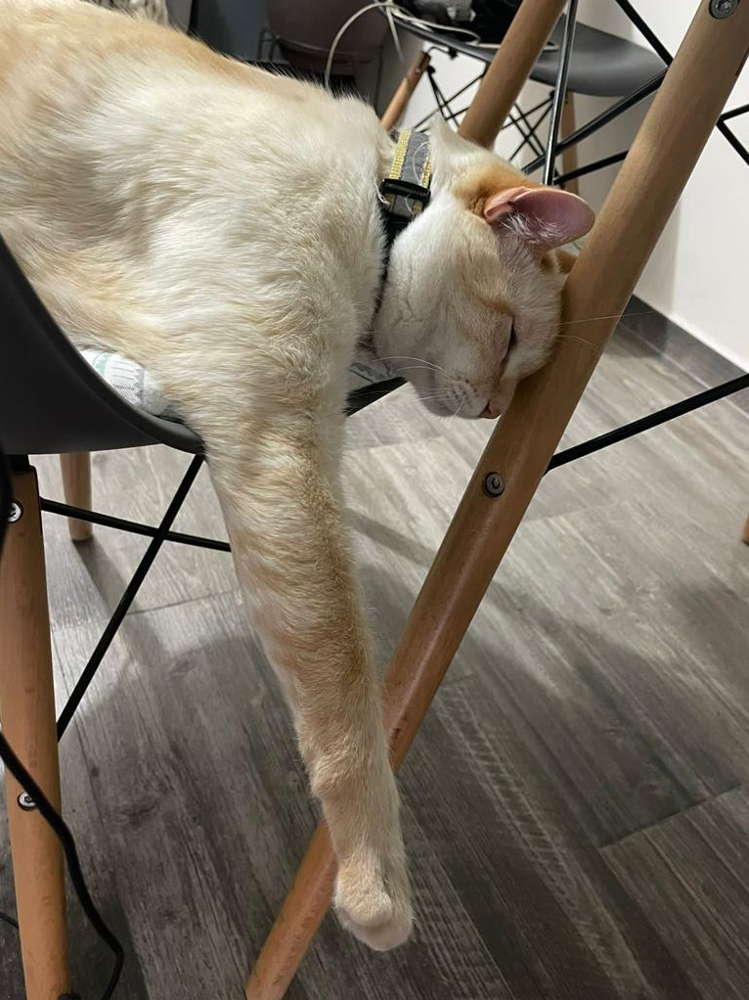

In [23]:
I = [0 0 0; 0 1 0; 0 0 0]
convolucion(I,foto)

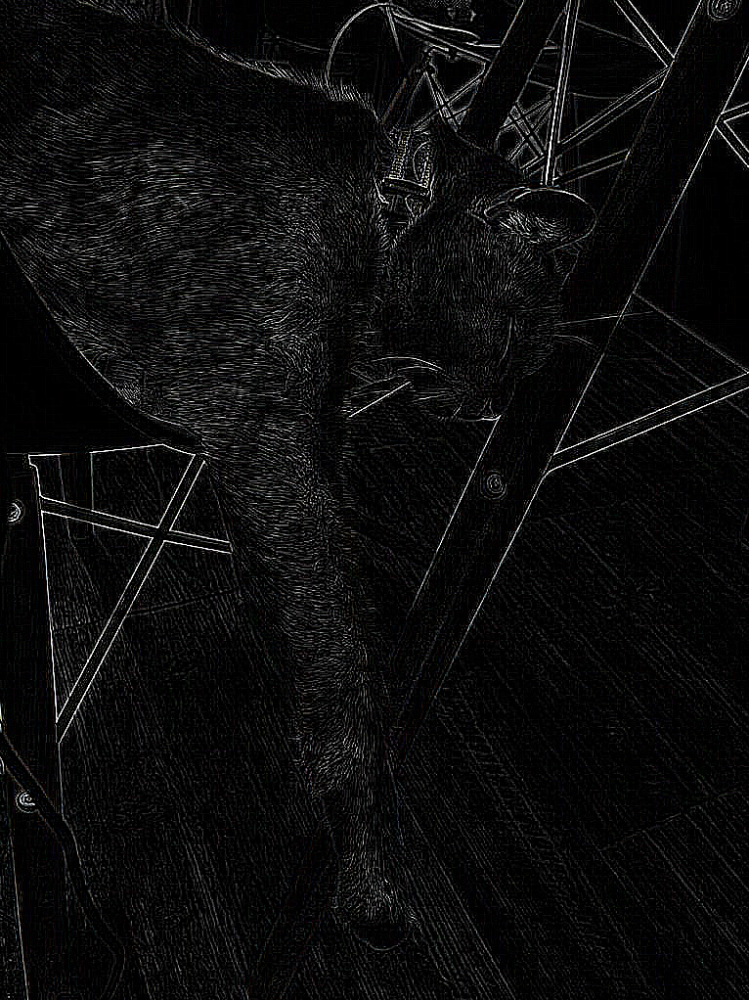

In [24]:
Bordes = [-1 -1 -1; -1 8 -1; -1 -1 -1]
convolucion(Bordes,foto)

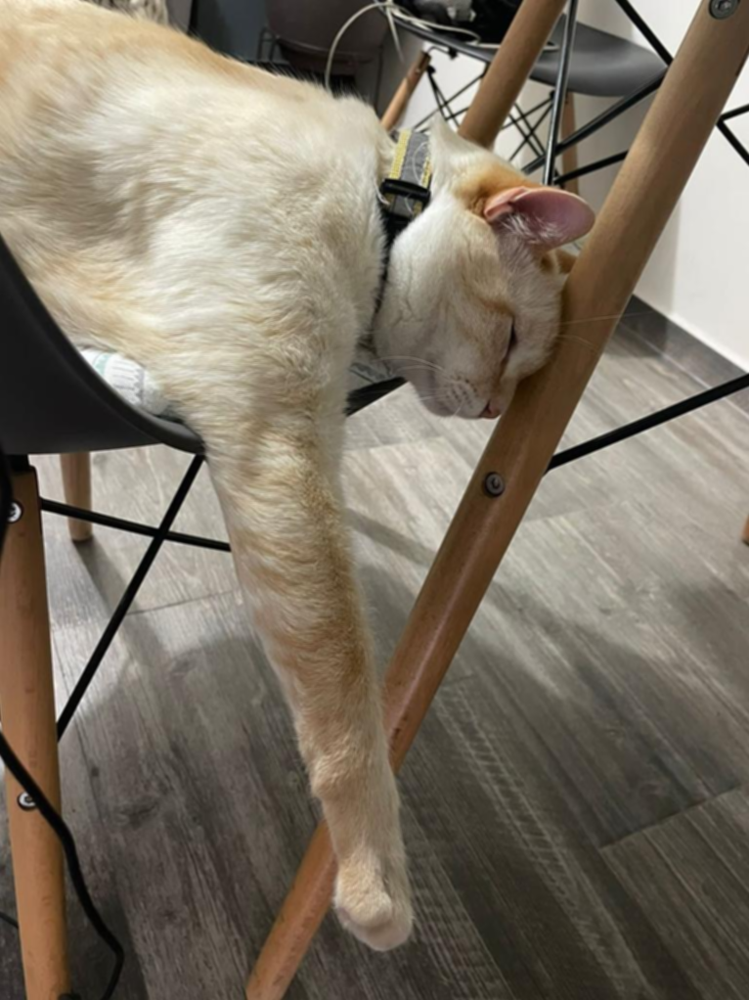

In [25]:
Desenfoque = [1 1 1; 1 1 1; 1 1 1] * 1/9
convolucion(Desenfoque,foto)

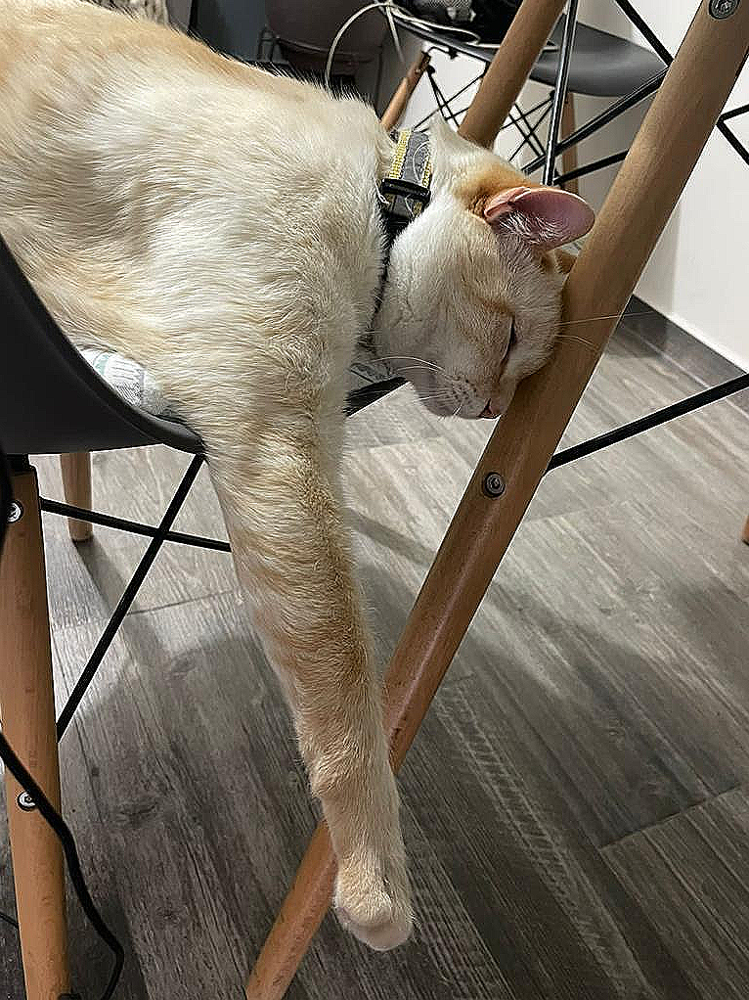

In [26]:
Enfocar = [0 -1 0; -1 5 -1; 0 -1 0]
convolucion(Enfocar,foto)

## Ejercicios avanzados

**Para sacar 7:** Partícula en una caja cuadrada

(i) Haz una función que dadas la posición y velocidad de una partícula en 2D, el lado de un cuadrado, el centro de ese cuadrado y el ángulo de inclinación del cuadrado, encuentre dónde colisionará primero la partícula con el cuadrado (si no colisiona con ninguna cara, entonces regresa (Inf, Inf)).

(ii) Haz otra función que "refleje" la velocidad de la partícula al colicionar con la cara del cuadrado siguiendo la ley de Snell.

(iii) Finalmente haz una animación  de una partícula rebotando dentro de una caja cuadrada de lado 1 rotada un ángulo  𝜋/5 , con velocidad inicial  (1,0)  y posición inicial  (0,0). Esta parte no es trivial, pues debes de poner pasos de tiempo fijos (y pequeños). Es decir, en cada paso de tiempo tienes que avanzar la partícula $\vec{v}\cdot dt$ si no hay colisión y si hay colisión debes de hacerlo en 2 pasos, avanzar la partícula hasta que hay la colisión un tiempo $dt'$ y después avanzarla el tiempo $dt-dt'$ ya con la nueva velocidad. En la animación asegúrate de dibujar la trayectoria de la partícula (para esto puedes usar tus objetos Segmento). 


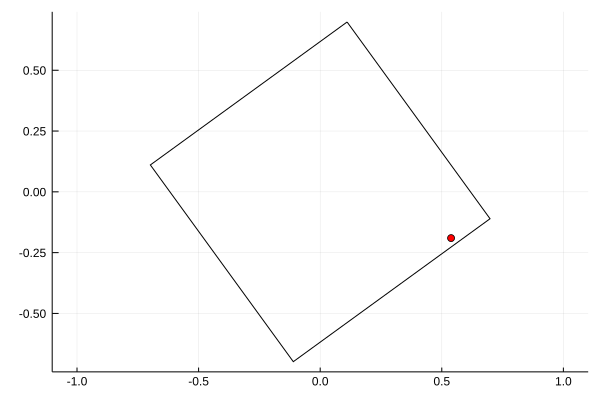

LoadError: InterruptException:

In [7]:
using LinearAlgebra
using Plots
function cuadrado(l,c,θ)
    verticesr=[]
    verticesrx=[]
    verticesry=[]
    vertices=[[l/2,l/2],[-l/2,l/2],[-l/2,-l/2],[l/2,-l/2]]
    rot=[cos(θ) -sin(θ);
         sin(θ)  cos(θ)]
    for i in 1:4
        push!(verticesrx,((rot*vertices[i])+c)[1])
        push!(verticesry,((rot*vertices[i])+c)[2])
    end
    plot(verticesrx,verticesry,ratio=1,seriestype=[:shape,],fillcolor=false,label="")
    return [[verticesrx[i],verticesry[i]] for i in 1:4]
end

function pelota(l,c,θ,v0,x0,h)
    x=x0[1]
    y=x0[2]
    vx=v0[1]
    vy=v0[2]
    
  @gif for t in 1:0.2:1000
        puntos=cuadrado(l,c,θ)
        x=x+vx*0.2
        y=y+vy*0.2
        p=[x,y]
        dis=[norm(p-puntos[1]),norm(p-puntos[2]),norm(p-puntos[3]),norm(p-puntos[4]),norm(p-puntos[1])]
        angulo=[]
        ang=[]
        for j in 1:3
            ang=append!(ang,acos(dot(puntos[j+1]-p,puntos[j]-p)/(norm(puntos[j+1]-p)*norm(puntos[j]-p))))
        end
        ang=append!(ang,acos(dot(puntos[1]-p,puntos[4]-p)/(norm(puntos[1]-p)*norm(puntos[4]-p))))
        for i in 1:3
            angulo=append!(angulo,acos(dot(puntos[i+1]-puntos[i],[vx,vy])/(norm(puntos[i+1]-puntos[i])*norm([vx,vy]))))
        end
        angulo=append!(angulo,acos(dot(puntos[1]-puntos[4],[vx,vy])/(norm(puntos[1]-puntos[4])*norm([vx,vy]))))
        for k in 1:4
            if (sin(ang[k])*dis[k+1]*dis[k])/l <= h
                
                rot=[cos(2*angulo[k]) -sin(2*angulo[k]); sin(2*angulo[k])  cos(2*angulo[k])]
                
                vn=(rot*[vx,vy])
                
                vx=vn[1]
                vy=vn[2]
                
            end
        end
        scatter!([x],[y],show=:ijulia,color=RGB(1,0,0),label="")
    end

end
pelota(1,[0,0],pi/5,[1,0],[0,0],0.1)

**Para sacar 8** En este problema necesitarás instalar la paquetería <a href=" https://juliaimages.org/v0.21/imagesegmentation/">ImageSegmentation</a>. Instala la paquetería si aún no la tienes y cárgala. 

El propósito es que obtengas una forma de obtener la posición y área de objetos automáticamente. Para hacer las cosas simples, nos restringiremos a fotos de objetos en una hoja de papel blanco (para que el contraste sea mayor). Tienes que hacer una función que dada una foto y algunos parámetros de "búsqueda", encuentre todos los objetos de la foto, su posición y el número de pixeles (equivalente al área). 

Para entender como hacer esto vamos a revisar el ejemplo de las monedas de la paquetería ImagesSegmentation: 

using Random
function get_random_color(seed)
    Random.seed!(seed)
    rand(RGB{N0f8})
end

1. using Images, ImageSegmentation
2. img = load(download("http://docs.opencv.org/3.1.0/water_coins.jpg"));
3. bw = Gray.(img) .> 0.5;
4. dist = 1 .- distance_transform(feature_transform(bw));
5. markers = label_components(dist .< -15);
6. segments = watershed(dist, markers)
7. map(i->get_random_color(i), labels_map(segments)) .* (1 .-bw)


La función get_random_color(seed), sólo genera un color aleatoriamente para cada número que se de, pero siempre el mismo color para un mismo número. Se podría cambiar por una lista de colores y ya. El resto del código lo explico a continuación:

En la primera línea se cargan las paqueterías, la segunda es para cargar la imágen (puedes aquí cargar una imagen propia). En la tercera línea se hace una matriz de "true" y "false", dependiendo de si la escala en grises es mayor o menor que 0.5 para cada pixel. Aquí puedes cambiar el 0.5 por otra cantidad. Es uno de los parámetros de identificación. 

La línea 4 es un poco más complicada, pero lo importante es que obtiene la transformada de la distancia, lo cual podemos entenderlo de la siguiente forma. Pensemos en la imagen como una hoja de papel con manchas que evitan que se prenda el papel en cierto grado. Si prendemos fuego desde las orillas del papel, la transformada de distancia nos diría en cada pixel cuánto tardó en quemarse desde que se prendió fuego a las orillas (si dibujas un heatmap de dist, verás esos "tiempos de quemado"). 

En la **línea 5** es la más importante, obtiene una matriz con números enteros. Cada elemento de la matriz corresponde a un pixel y cada número a qué objeto corresponde. Uno puede jugar un poco con ese -15 para ver qué objetos obtiene. 

La línea 6 se genera una segmentación de la imagen. Prueba heatmap(segments.image_indexmap) para que veas cómo se segmenta la imagen. Cómo lo hace, pues tiene que ver con la distancia que se calculó y reconocer que hay un fondo homogeneo. Entonces, digamos que cada marker emite alguna sustancia. Localiza dónde se encuentran las sustancias por primera vez y así segmenta la imagen. 

Finalmente la **línea 7** asigna un color aleatoria a cada segmento y después multiplica esto por 1-bw, que es una matriz con 0 si no tiene moneda y 1 si la tiene, de forma que el resultado una matriz de colores, negro si no tienen moneda y algún color aleatorio si sí tiene. 

Entonces, en el problema tienes que primero hacer una función para transformar las coordenadas de los elementos de una matriz en coordenadas en el espacio $x,y$. Es decir, que cada pixel tenga una coordenada. Luego, hacer una función que dados los dos parámetros (el 0.5 y el -15 en el ejemplo) genere una matriz de enteros donde se tenga 0 si no hay un objeto y un número que corresponda al marker si sí hay objeto. Luego, debes hacer otra función que dada una matriz de enteros $A$, obtenga la posición promedio de los elementos de $A$ que tienen como valor $n$ para cada valor $n$ de $A$. Esa función también debe arrojar el número de elementos de $A$ que tienen valor $n$. Es decir, la función debe arrojar 2 listas, una con las coordenadas de los $N$ objetos y otra con el número de pixeles de los $N$ objetos. Finalmente une todoo para hacer la función que se pide (dada la imagen y los dos parámetros obtener la posición y áreas de todos los objetos). 

Prueba tu función con una fotografía (que incluyas en la tarea) de varias monedas sobre una hoja de papel blanco. 



**Para sacar 9:** Como dijimos en un problema anterior, hacer gráficas usando surface es latoso, porque gr, pyplot y plotly tienen diferentes formatos y ninguno es tan agradable. En particular, graficar un poliedro es latoso. Para superar esto se puede generar una función para hacer dibujos 3D desde los 2D (como de hecho se hace siempre) o bien, recurrir a otra paquetería. 

En este problema se trata de hacer una función para graficar un objeto Poliedro usando perspectiva. Debes agregar los metodos a plot y una plot! para graficar un poliedro, para lo cual tendrás que dar además una "posición de la cámara" y la "dirección de la cámara" (ver figura).  

Deberás hacer la proyección 2D del poliedro según la posición y dirección de la cámara, pero debes de considerar que los objetos se ven más pequeños si están más lejos de la cámara, es decir, la posición de los vértices se debe de modificar (sigue la idea de la figura).  

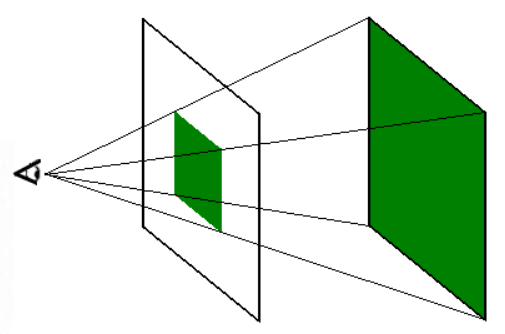

Prueba tus funciones dibujando varios cubos en posiciones (y giros) aleatorias. 

**Nota:** <a href="https://makie.juliaplots.org/stable/Makie">Makie</a> es en realidad la buena opción en estos casos. Es una paquetería más poderosa y más bonita que Plots y funciona muy bien para 3D, pero tiene varias dificultades (por las que no la incluí en este curso). Aún así los motivo a revisar la paquetería, sólo háganlo en un notebook aparte, pues es incompatible con Plots. Es decir, no es para esta tarea, es digamos, conocimiento fuera del curso que les puede servir en el futuro. 

**Para sacar 10:** **Dimensión fractal:** Una idea "intuitiva" para calcular la dimensión fractal de una figura 2D, consiste en cuadricular la imagen que contiene la figura y después contar el número $N$ de cuadrados que contienen parte de la figura como función de la longitud $\epsilon$ del lado de los cuadrados. En ese caso, la dimensión fractal se puede calcular como: 

$$dim_f = lim_{\epsilon\rightarrow 0} \frac{N(\epsilon)}{log(1/\epsilon)}.$$

En las imágenes reales (fotografías o dibujos), no existe realmente nada fractal, todo tiene dimensión 2; sin embargo, muchos objetos son aproximadamente fractales, es decir, aunque para $lim_{\epsilon\rightarrow 0}$ la dimensión tiende a 2, para valores muy pequeños de $\epsilon$, $\frac{N(\epsilon)}{log(1/\epsilon)}$ parece tender a un número no entero. 

Haz una función que dada una imagen, una forma de elegir qué pixeles corresponden a una determinada figura (por ejemplo un rango de colores), calcule $\frac{N(\epsilon)}{log(1/\epsilon)}$. 

Finalmente, grafica  $\frac{N(\epsilon)}{log(1/\epsilon)}$ vs $\epsilon$ para las imágenes de fractales que produjiste en el problema 6. También haz la gráfica para la foto de algún rio o algo que creas que es fractal (y que no te cueste demasiado seleccionar los pixeles que corresponden a tu objeto (quizá haciendo previamente una (o varias) convolución(es) adecuada(s))). 

¿qué conclusiones sacas de esto?

**Nota que:** 

(i) La longitud de la imágen entre $\epsilon$ no es necesariamente un entero, lo que significa que podría haber cajas en 2 de las fronteras de la imagen que no sean cuadradas y que cuyos lados sean menores que $\epsilon$. Por lo tanto, conviene que el objeto al que quieres medir la dimensión fractal no toque (y esté suficientemente lejos de) las fronteras de la imagen.  

(ii) Si $\epsilon< 1px$ deberías empezar a ver que $\frac{N(\epsilon)}{log(1/\epsilon)}$ tiene un cambio de comportamiento y tiende a 2 (quizá un poco antes para el caso de una fotografía de un río, arbol, galaxia, etc...). 

**Para sacar 11:** Haz una función que dada una dirección de la forma  $(x,y,0)$, una rapidez y un tiempo, haga una animación de una Persona de altura  $h=1$  caminando sobre esa recta ese tiempo (el tamaño de los pasos debe ser  $h/2$ ). Trata que la animación sea lo más realista posible (observa qué es lo que haces al caminar, como mueves tus piernas y brazos). 

Trata de que se vea como el gif animado que adjunto con la tarea. 